# Bibliotecas

In [ ]:
from sklearn.metrics import confusion_matrix, f1_score

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import LabelEncoder

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import VotingClassifier, BaggingClassifier, AdaBoostClassifier


In [ ]:
# 1. Cargar el dataset
# Asegúrate de reemplazar con la ruta correcta de tu archivo CSV
data = pd.read_csv('caracteristicas_papa_nativa_atributos.csv')

## 2. Limpiar la columna

In [ ]:
data['etiqueta'] = data['etiqueta'].str.replace(r'\(.*\)', '', regex=True)

In [ ]:
# Seleccionar características y objetivo
X = data.select_dtypes(include=['float64', 'int64']).drop(columns=['nombre_imagen'], errors='ignore')
y = data['etiqueta']

In [ ]:
# Codificar etiquetas si son categóricas
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

In [ ]:
# 5. Dividir los datos en entrenamiento y prueba (80% entrenamiento, 20% prueba)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# 6. Aplicar SMOTE para balancear las clases en los datos de entrenamiento
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

## Random Forest

In [ ]:
#Inicializar el modelo de Random Forest
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Entrenar el modelo con los datos balanceados
rf_model.fit(X_train_resampled, y_train_resampled)

# 9. Predecir las etiquetas en el conjunto de prueba
y_pred = rf_model.predict(X_test)

# Calcular y mostrar el Macro F1-Score
macro_f1 = f1_score(y_test, y_pred, average='macro')
print(f"Macro F1-Score: {macro_f1}")

Macro F1-Score: 0.9166414154012057


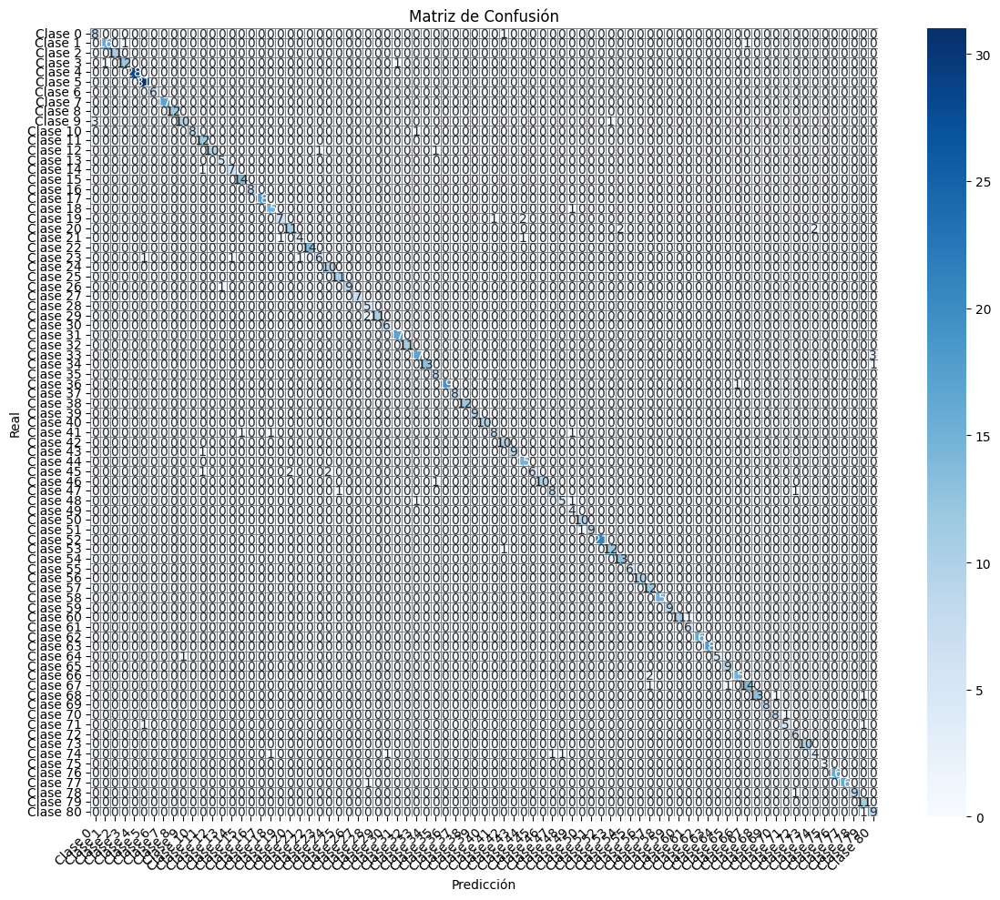

In [ ]:
import seaborn as sns
# Calcular la matriz de confusión
conf_matrix = confusion_matrix(y_test, y_pred)

# Crear un mapa de calor para la matriz de confusión
plt.figure(figsize=(12, 10))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=True,
            xticklabels=[f'Clase {i}' for i in range(conf_matrix.shape[1])],
            yticklabels=[f'Clase {i}' for i in range(conf_matrix.shape[0])],
            linewidths=0.5, linecolor='gray')

# Etiquetas y título
plt.title('Matriz de Confusión')
plt.xlabel('Predicción')
plt.ylabel('Real')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

## KNN

In [ ]:
# Configurar el modelo KNN con parámetros iniciales sugeridos
knn_model = KNeighborsClassifier(
    n_neighbors=7,       # Número de vecinos
    weights='distance',  # Ponderación por distancia
    metric='euclidean'   # Métrica de distancia
)

# Entrenar el modelo con los datos balanceados
knn_model.fit(X_train_resampled, y_train_resampled)

# Predecir las etiquetas en el conjunto de prueba
y_pred_knn = knn_model.predict(X_test)

# Calcular y mostrar el Macro F1-Score
macro_f1_knn = f1_score(y_test, y_pred_knn, average='macro')
print(f"KNN Macro F1 Score (Parámetros sugeridos): {macro_f1_knn:.4f}")


KNN Macro F1 Score (Parámetros sugeridos): 0.2087


## Arbol de decisión

In [ ]:
# Configurar el modelo de Árbol de Decisión con hiperparámetros sugeridos
ad_model = DecisionTreeClassifier(
    criterion='gini',        # Función de calidad (puede ser 'entropy' también)
    max_depth=10,            # Profundidad máxima para evitar sobreajuste
    min_samples_split=10,    # Mínimo de muestras para dividir un nodo
    min_samples_leaf=5,      # Mínimo de muestras en una hoja
    random_state=42          # Reproducibilidad
)

# Entrenar el modelo con los datos balanceados
ad_model.fit(X_train_resampled, y_train_resampled)

# Predecir las etiquetas en el conjunto de prueba
y_pred_ad = ad_model.predict(X_test)

# Calcular y mostrar el Macro F1-Score
macro_f1_ad = f1_score(y_test, y_pred_ad, average='macro')
print(f"AD Macro F1 Score: {macro_f1_ad:.4f}")

AD Macro F1 Score (Parámetros sugeridos): 0.3492


## Naive Bayes (NB)

In [ ]:
# Clasificador Naïve Bayes (NB)
nb_model = GaussianNB()

nb_model.fit(X_train_resampled, y_train_resampled)

y_pred_nb = nb_model.predict(X_test)
macro_f1_nb = f1_score(y_test, y_pred_nb, average='macro')
print(f"NB Macro F1 Score: {macro_f1_nb:.4f}")

NB Macro F1 Score: 0.6168


##  Perceptrón Multicapa

In [ ]:
# Perceptrón Multicapa (MLP)
mlp_model = MLPClassifier(random_state=42, max_iter=500)
mlp_model.fit(X_train_resampled, y_train_resampled)
y_pred_mlp = mlp_model.predict(X_test)
macro_f1_mlp = f1_score(y_test, y_pred_mlp, average='macro')
print(f"MLP Macro F1 Score: {macro_f1_mlp:.4f}")


MLP Macro F1 Score: 0.1863


## Ensamble Voting

In [ ]:
# Ensamble Voting
voting_model = VotingClassifier(estimators=[
    ('rf', RandomForestClassifier(random_state=42)),
    ('knn', KNeighborsClassifier()),
    ('nb', GaussianNB())
], voting='soft')
voting_model.fit(X_train_resampled, y_train_resampled)
y_pred_voting = voting_model.predict(X_test)
macro_f1_voting = f1_score(y_test, y_pred_voting, average='macro')
print(f"Voting Macro F1 Score: {macro_f1_voting:.4f}")

Voting Macro F1 Score: 0.6953


## Ensamble Bagging

In [ ]:
# Ensamble Bagging
bagging_model = BaggingClassifier(random_state=42)
bagging_model.fit(X_train_resampled, y_train_resampled)
y_pred_bagging = bagging_model.predict(X_test)
macro_f1_bagging = f1_score(y_test, y_pred_bagging, average='macro')
print(f"Bagging Macro F1 Score: {macro_f1_bagging:.4f}")

Bagging Macro F1 Score: 0.8779


## Ensamble Boosting

In [ ]:
# Ensamble Boosting
boosting_model = AdaBoostClassifier(random_state=42)
boosting_model.fit(X_train_resampled, y_train_resampled)
y_pred_boosting = boosting_model.predict(X_test)
macro_f1_boosting = f1_score(y_test, y_pred_boosting, average='macro')
print(f"Boosting Macro F1 Score: {macro_f1_boosting:.4f}")

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Boosting Macro F1 Score: 0.0213


## Graficas

KNN - F1 Macro: 0.1525
AD - F1 Macro: 0.7350
NB - F1 Macro: 0.5968
MLP - F1 Macro: 0.0321
RF - F1 Macro: 0.9066
Voting - F1 Macro: 0.6603
Bagging - F1 Macro: 0.8486


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Boosting - F1 Macro: 0.0196


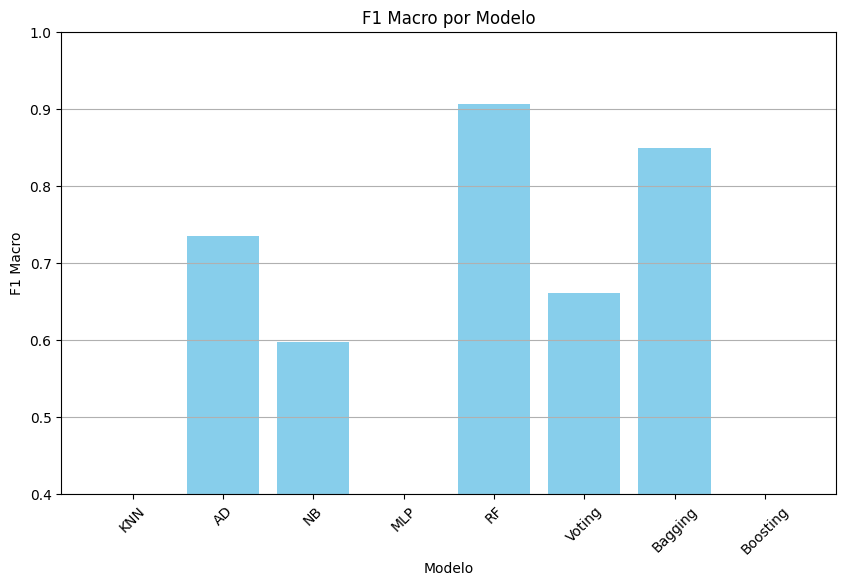

In [ ]:
from sklearn.metrics import f1_score
import matplotlib.pyplot as plt

# Diccionario para almacenar los modelos y sus nombres
modelos = {
    'KNN': KNeighborsClassifier(),
    'AD': DecisionTreeClassifier(random_state=42),
    'NB': GaussianNB(),
    'MLP': MLPClassifier(random_state=42, max_iter=500),
    'RF': RandomForestClassifier(random_state=42),
    'Voting': VotingClassifier(estimators=[
        ('rf', RandomForestClassifier(random_state=42)),
        ('knn', KNeighborsClassifier()),
        ('nb', GaussianNB())
    ], voting='soft'),
    'Bagging': BaggingClassifier(random_state=42),
    'Boosting': AdaBoostClassifier(random_state=42)
}

# Diccionario para almacenar los resultados
resultados = {
    'Modelo': [],
    'F1 Macro': []  # Solo F1-macro
}

# Entrenar, predecir y evaluar cada modelo
for nombre, modelo in modelos.items():
    modelo.fit(X_train, y_train)
    y_test_pred = modelo.predict(X_test)

    # Cálculo de F1-macro
    f1_macro = f1_score(y_test, y_test_pred, average='macro')

    # Almacenar los resultados
    resultados['Modelo'].append(nombre)
    resultados['F1 Macro'].append(f1_macro)

    print(f"{nombre} - F1 Macro: {f1_macro:.4f}")

# Graficar los resultados
fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(resultados['Modelo'], resultados['F1 Macro'], color='skyblue')
ax.set_ylim(0.4, 1.0)
ax.set_title('F1 Macro por Modelo')
ax.set_xlabel('Modelo')
ax.set_ylabel('F1 Macro')
ax.grid(axis='y')
plt.xticks(rotation=45)
plt.show()


In [ ]:
# 11. Mostrar la distribución de clases después de aplicar SMOTE
print("\nDistribución de clases después de SMOTE:")
print(pd.Series(y_train_resampled).value_counts())


Distribución de clases después de SMOTE:
etiqueta
42     135
28     135
77     135
67     135
63     135
      ... 
84     135
65     135
18     135
64     135
79     135
Name: count, Length: 81, dtype: int64


In [ ]:
# 12. Mostrar las características más importantes del modelo Random Forest
feature_importances = pd.DataFrame(rf_model.feature_importances_,
                                   index=X_train.columns,
                                   columns=['importance']).sort_values('importance', ascending=False)
print("\nCaracterísticas más importantes del modelo Random Forest:")
print(feature_importances)


Características más importantes del modelo Random Forest:
                      importance
hu_moment_1             0.034972
hu_moment_2             0.031995
percentil_25_r.3        0.030418
std_r.7                 0.030008
circularidad            0.029454
...                          ...
hu_moment_6             0.004265
color_predominante_g    0.004068
color_predominante_b    0.003810
hu_moment_7             0.001524
num_ojos                0.000000

[70 rows x 1 columns]


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

          1        0.73      0.89      0.80         9
         10        0.94      0.89      0.91        18
         11        1.00      1.00      1.00        11
         12        0.92      0.86      0.89        14
         14        1.00      1.00      1.00        28
         15        0.94      1.00      0.97        31
         17        1.00      1.00      1.00         6
         18        1.00      1.00      1.00        17
         19        1.00      1.00      1.00        12
          2        0.91      0.71      0.80        14
         20        1.00      0.89      0.94         9
         21        0.80      1.00      0.89        12
         22        1.00      0.83      0.91        12
         23        0.83      1.00      0.91         5
         24        0.88      0.88      0.88         8
         25        0.93      1.00      0.97        14
         26        1.00      1.00      1.00         8
         27        1.00    

In [ ]:
data

,area,perimetro,aspect_ratio,extent,circularidad,hu_moment_1,hu_moment_2,hu_moment_3,hu_moment_4,hu_moment_5,hu_moment_6,hu_moment_7,media_r,std_r,percentil_25_r,percentil_75_r,media_r.1,std_r.1,percentil_25_r.1,percentil_75_r.1,media_r.2,std_r.2,percentil_25_r.2,percentil_75_r.2,media_r.3,std_r.3,percentil_25_r.3,percentil_75_r.3,media_r.4,std_r.4,percentil_25_r.4,percentil_75_r.4,media_r.5,std_r.5,percentil_25_r.5,percentil_75_r.5,media_r.6,std_r.6,percentil_25_r.6,percentil_75_r.6,media_r.7,std_r.7,percentil_25_r.7,percentil_75_r.7,media_r.8,std_r.8,percentil_25_r.8,percentil_75_r.8,glcm_contrast,glcm_dissimilarity,glcm_homogeneity,glcm_energy,glcm_correlation,haralick_1,haralick_2,haralick_3,haralick_4,haralick_5,haralick_6,haralick_7,haralick_8,haralick_9,haralick_10,haralick_11,haralick_12,haralick_13,color_predominante_r,color_predominante_g,color_predominante_b,num_ojos,etiqueta,nombre_imagen
0,141194.0,1692.989018,0.531100,0.676246,0.619039,0.705611,1.934432,3.193659,3.920413,7.493589,4.931909,-8.028409,58.033721,20.609559,44.00,72.00,69.070634,24.696952,52.00,86.00,78.646476,27.040899,60.00,97.00,17.442887,15.995819,14.0,17.0,66.611225,15.426094,59.00,76.00,78.679915,27.013103,60.00,97.0,75.674095,27.569069,57.00,95.00,130.064667,1.032545,129.0,131.00,136.081365,3.869158,133.0,139.0,55.067447,0.884853,0.855372,0.717127,0.976783,0.514271,55.067447,0.976783,1185.851608,0.855372,39.848534,4688.338983,3.001807,3.604276,0.003873,1.231267,-0.673977,0.986989,119.6,112.0,102.2,1,1,1 (1).jpg
1,132267.5,1630.947388,0.529605,0.675606,0.624861,0.704847,1.928899,3.195742,3.918714,7.491978,4.927705,-8.028206,58.922767,20.982733,44.00,73.00,70.916916,25.180344,53.00,89.00,81.119708,27.653086,62.00,100.00,17.825951,16.740582,15.0,17.0,69.790628,15.760310,63.00,79.00,81.150999,27.630671,62.00,100.0,77.809369,28.039689,58.00,98.00,130.160513,1.017068,129.0,131.00,136.714290,3.992107,134.0,139.0,55.939769,0.933519,0.848132,0.727124,0.977054,0.528709,55.939769,0.977054,1218.840986,0.848132,39.484291,4819.424174,2.921523,3.559840,0.003814,1.282648,-0.655404,0.984199,135.8,129.6,121.8,1,1,1 (2).jpg
2,128017.5,1623.148400,0.519135,0.682716,0.610608,0.699298,1.900166,3.135597,3.837784,7.340955,4.832687,-7.877530,59.220295,21.530283,44.00,74.00,71.006091,25.541892,53.00,90.00,81.065412,27.905131,62.00,101.00,17.516963,15.298729,15.0,17.0,69.220357,14.741921,63.00,78.00,81.095974,27.878203,62.00,101.0,77.859046,28.354539,58.00,99.00,130.127211,1.022071,129.0,131.00,136.571949,3.783852,134.0,139.0,64.591777,1.013400,0.838285,0.688535,0.975828,0.474080,64.591777,0.975828,1335.963941,0.838285,45.108615,5279.263988,3.264024,3.938891,0.003643,1.335490,-0.665422,0.990006,119.6,111.2,101.4,1,1,1 (3).jpg
3,146324.0,1693.332164,1.852941,0.683119,0.641270,0.713629,1.969772,3.331962,4.099396,7.828307,5.126422,-8.376715,60.101259,23.231911,39.00,79.00,75.494237,27.616277,51.00,100.00,87.800794,30.355169,60.00,115.00,17.731938,13.936917,15.0,18.0,82.044200,17.470025,73.00,92.00,87.815999,30.357644,60.00,115.0,83.070020,30.430145,56.00,110.00,130.523246,1.042182,130.0,131.00,139.023433,4.187530,136.0,142.0,65.388286,1.139777,0.813638,0.672671,0.979193,0.452487,65.388286,0.979193,1571.163454,0.813638,50.526826,6219.265529,3.395022,4.186855,0.003388,1.502065,-0.634259,0.989530,142.2,134.2,124.2,1,1,1 (4).jpg
4,139652.5,1666.805252,1.891239,0.673979,0.631668,0.692288,1.855220,3.138292,3.798235,7.285708,4.780980,7.791090,59.095456,24.984889,37.00,80.00,71.902834,29.407712,46.00,97.00,82.459307,31.851246,55.00,110.00,20.071129,24.116703,15.0,18.0,74.262874,16.791008,66.00,83.00,82.466102,31.856400,55.00,110.0,78.646286,32.611429,50.00,107.00,130.165637,1.191041,129.0,131.00,137.247302,3.866457,135.0,140.0,69.480054,1.220317,0.802682,0.658428,0.977061,0.433528,69.480054,0.977061,1514.323040,0.802682,50.107711,5987.812106,3.565012,4.417864,0.003313,1.571127,-0.628066,0.991062,138.0,130.8,122.2,1,1,1 (5).jpg
5,164917.0,1851.214412,0.515284,0.678118,0.604730,0.6884

In [ ]:
!pip install onnxruntime

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 25.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 8.9 MB/s eta 0:00:00


In [ ]:
!pip install scikit-learn skl2onnx onnxruntime

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 298.4/298.4 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 42.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.5/84.5 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 30.3 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 4.25.5
    Uninstalling protobuf-4.25.5:
      Successfully uninstalled protobuf-4.25.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
grpcio-status 1.62.3 requires protobuf>=4.21.6, but you have protobuf 3.20.2 which is incompatible.
tensorflow 2.17.1 requires protobuf!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<5.0.0dev,>=3.20.3, but you have protobuf 3.20.2 which is incompatible.
tensorflow-metadata 1.13.1 requires protobuf<5,>=3.20.3, but you have protobuf 3.20.2 w

In [ ]:
import onnx
import skl2onnx
from skl2onnx import convert_sklearn
from skl2onnx.common.data_types import FloatTensorType
from sklearn.ensemble import RandomForestClassifier


# 2. Convertir el modelo a ONNX
initial_type = [('float_input', FloatTensorType([None, X_train_resampled.shape[1]]))]

# Convertir el modelo de Scikit-learn a ONNX
onnx_model = convert_sklearn(rf_model, initial_types=initial_type)

# 3. Guardar el modelo ONNX en un archivo
onnx.save_model(onnx_model, "random_forest_model.onnx")

print("Modelo ONNX guardado como 'random_forest_model.onnx'")


Modelo ONNX guardado como 'random_forest_model.onnx'


In [ ]:
import os
os.kill(os.getpid(), 9)
